In [1]:
%reload_ext autoreload
%autoreload 2
%matplotlib inline

In [2]:
from pathlib import Path
from fastai.vision import *
from fastai.metrics import error_rate

In [3]:
path = Path('../input/tyre-condition-prediction-dataset/tyres'); 
path

PosixPath('../input/tyre-condition-prediction-dataset/tyres')

In [4]:
pathTest = path/'TEST'
pathTrain = path/'TRAIN'
pathTest.ls()

[PosixPath('../input/tyre-condition-prediction-dataset/tyres/TEST/class_1'),
 PosixPath('../input/tyre-condition-prediction-dataset/tyres/TEST/class_2'),
 PosixPath('../input/tyre-condition-prediction-dataset/tyres/TEST/class_3')]

In [5]:
numberOfFiles = (pathTest/'class_1').ls()
numberOfFiles[:5]

[PosixPath('../input/tyre-condition-prediction-dataset/tyres/TEST/class_1/Normal (398).jpg'),
 PosixPath('../input/tyre-condition-prediction-dataset/tyres/TEST/class_1/Normal-429.jpg'),
 PosixPath('../input/tyre-condition-prediction-dataset/tyres/TEST/class_1/Normal (397).jpg'),
 PosixPath('../input/tyre-condition-prediction-dataset/tyres/TEST/class_1/Normal (380).jpg'),
 PosixPath('../input/tyre-condition-prediction-dataset/tyres/TEST/class_1/Normal (370).jpg')]

In [6]:
data = ImageDataBunch.from_folder(path, ds_tfms=get_transforms(), valid_pct=0.2, size=224).normalize(imagenet_stats)

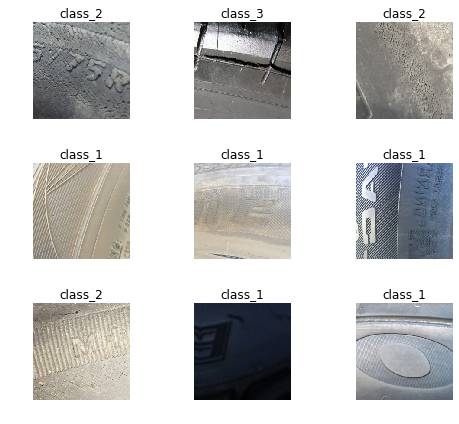

In [7]:
data.show_batch(rows=3, figsize=(7,6))

In [8]:
print(data.classes)
len(data.classes),data.c

['class_1', 'class_2', 'class_3']


(3, 3)

In [9]:
learn = cnn_learner(data, models.resnet34, metrics=error_rate)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/checkpoints/resnet34-333f7ec4.pth
100%|██████████| 83.3M/83.3M [00:08<00:00, 10.1MB/s]


In [10]:
learn.fit_one_cycle(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.699175,0.701472,0.190000,00:41
1,1.142704,0.623145,0.230000,00:39
2,0.871088,0.554741,0.160000,00:39
3,0.720259,0.488771,0.160000,00:40


In [11]:
learn.model_dir = "/kaggle/working"
learn.save('stage-1', return_path=True)

PosixPath('/kaggle/working/stage-1.pth')

In [12]:
interp = ClassificationInterpretation.from_learner(learn)

losses,idxs = interp.top_losses()

len(data.valid_ds)==len(losses)==len(idxs)

True

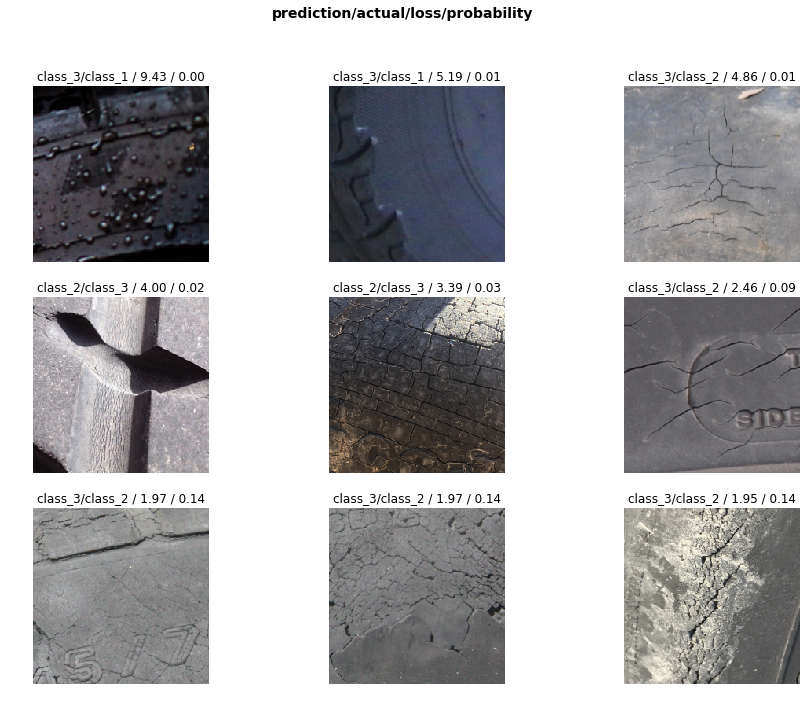

In [13]:
interp.plot_top_losses(9, figsize=(15,11))

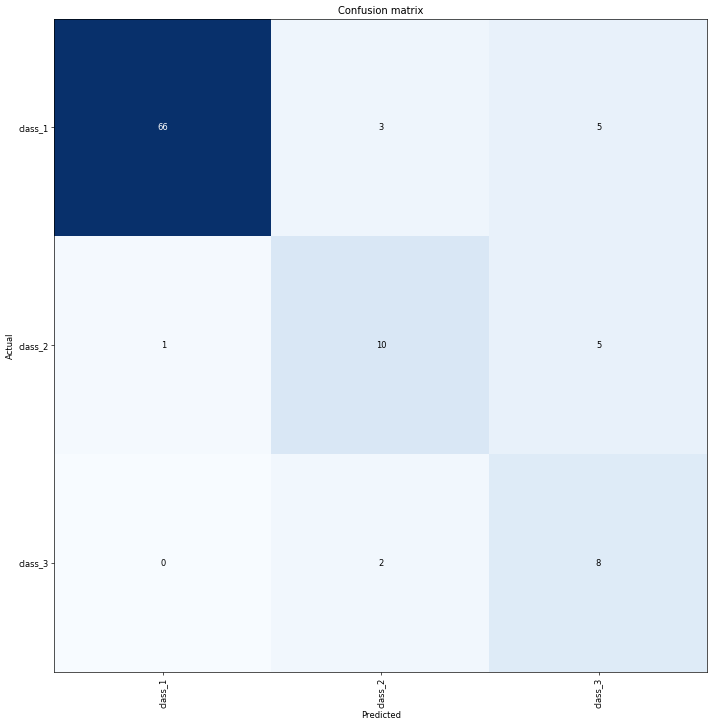

In [14]:
interp.plot_confusion_matrix(figsize=(12,12), dpi=60)

In [15]:
interp.most_confused(min_val=2)

[('class_1', 'class_3', 5),
 ('class_2', 'class_3', 5),
 ('class_1', 'class_2', 3),
 ('class_3', 'class_2', 2)]

In [16]:
learn.unfreeze()

In [17]:
learn.fit_one_cycle(1)

epoch,train_loss,valid_loss,error_rate,time
0,0.361970,2.637048,0.420000,00:40


In [18]:
learn.load('stage-1');

In [19]:
learn.lr_find()

LR Finder is complete, type {learner_name}.recorder.plot() to see the graph.


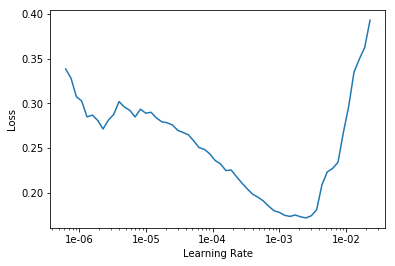

In [20]:
learn.recorder.plot()

In [21]:
learn.unfreeze()
learn.fit_one_cycle(2, max_lr=slice(1e-6,1e-4))

epoch,train_loss,valid_loss,error_rate,time
0,0.301928,0.464930,0.140000,00:40
1,0.297703,0.428563,0.120000,00:39


In [22]:
learn.path = Path("/kaggle/working")
learn.export()

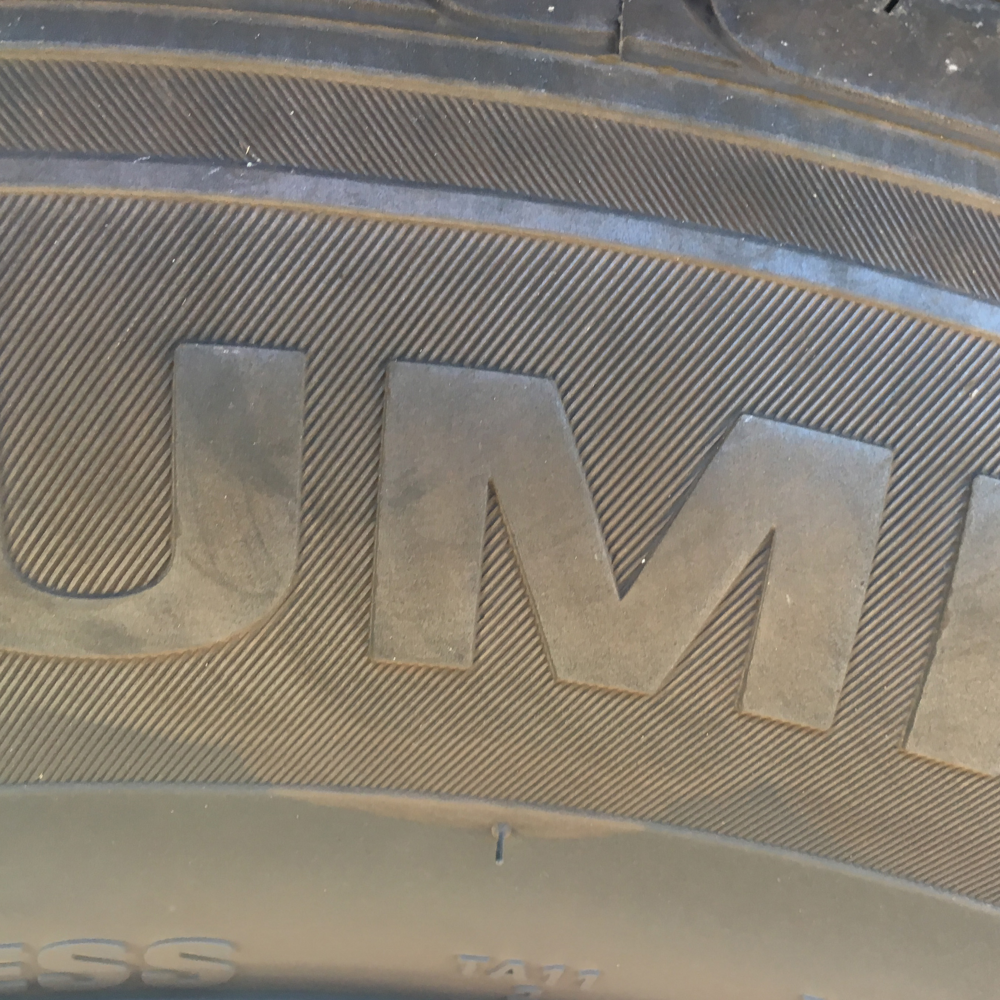

In [23]:
testImageList = ImageList.from_folder(pathTest/'class_1')
image = open_image(testImageList.items[0])
image

In [24]:
model = load_learner(learn.path)
className, label, probability = model.predict(image)

In [25]:
className

Category class_1

In [26]:
label

tensor(0)

In [27]:
probability

tensor([9.9888e-01, 8.2113e-05, 1.0353e-03])